## Environment Setup

### Install pyspark

In [ ]:
! pip install pyspark

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 310.8/310.8 MB 4.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyspark: filename=pyspark-3.4.1-py2.py3-none-any.whl size=311285398 sha256=a0c6d4317850eef3424f8d5a8ca684120f0277c781a86f970d9a324cee52219e
  Stored in directory: /root/.cache/pip/wheels/0d/77/a3/ff2f74cc9ab41f8f594dabf0579c2a7c6de920d584206e0834
Successfully built pyspark


### Install geopandas

In [ ]:
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 25.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 84.9 MB/s eta 0:00:00


### Install folium

In [ ]:
!pip install folium

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


### Mount Google Drive

In [ ]:
# Mount google drive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Load Data

In [ ]:
# Load the dataset from drive to current environment
!unzip /content/drive/MyDrive/tim_dataset/dataverse_files.zip

Archive:  /content/drive/MyDrive/tim_dataset/dataverse_files.zip
  inflating: sms-call-internet-mi-2013-11-01.txt  
  inflating: sms-call-internet-mi-2013-11-02.txt  
  inflating: sms-call-internet-mi-2013-11-03.txt  
  inflating: sms-call-internet-mi-2013-11-04.txt  
  inflating: sms-call-internet-mi-2013-11-05.txt  
  inflating: sms-call-internet-mi-2013-11-06.txt  
  inflating: sms-call-internet-mi-2013-11-07.txt  
  inflating: sms-call-internet-mi-2013-11-08.txt  
  inflating: sms-call-internet-mi-2013-11-09.txt  
  inflating: sms-call-internet-mi-2013-11-10.txt  
  inflating: sms-call-internet-mi-2013-11-11.txt  
  inflating: sms-call-internet-mi-2013-11-12.txt  
  inflating: sms-call-internet-mi-2013-11-13.txt  
  inflating: sms-call-internet-mi-2013-11-14.txt  
  inflating: sms-call-internet-mi-2013-11-15.txt  
  inflating: sms-call-internet-mi-2013-11-16.txt  
  inflating: sms-call-internet-mi-2013-11-17.txt  
  inflating: sms-call-internet-mi-2013-11-18.txt  
  inflating: sms-

## Imports

In [ ]:
from pyspark.sql import SparkSession
from pyspark.sql.types import *
from pyspark.sql.functions import *
import time
import pandas as pd
from pandas import DataFrame
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import datetime
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_percentage_error, mean_absolute_error
from sklearn.model_selection import GridSearchCV

import geopandas as gpd
import folium

In [ ]:
spark = SparkSession.builder.master("local[*]").appName('Mobile Network Traffic Analysis').getOrCreate()
sdf_original=spark.read.option("delimiter",'\t').csv('/content/')
sdf_original.show(10)

+---+-------------+---+--------------------+-------------------+--------------------+--------------------+--------------------+
|_c0|          _c1|_c2|                 _c3|                _c4|                 _c5|                 _c6|                 _c7|
+---+-------------+---+--------------------+-------------------+--------------------+--------------------+--------------------+
|  1|1384902000000|  0|                null|               null|                null|0.001787310105499...|                null|
|  1|1384902000000| 33|                null|               null| 0.02730046487718618|                null|                null|
|  1|1384902000000| 39|  0.1348005126527316|0.19181302200520325|0.052274848528573205|                null|  11.156091392623864|
|  1|1384902600000|  0| 0.05460092975437236|               null|                null|                null|                null|
|  1|1384902600000| 39| 0.21553886667139055|0.05584946873957208|                null|  0.082525664124158

The network traffic is measured in terms of number of call detail records (CDR) generated by mobile Internet sessions. This is only a proxy for the actual traffic volume in bytes, which provides however a decent estimate for the spatiotemporal dynamics of mobile data traffic.
For our analysis, _c0, _c1 and _c7 are considered which are square_id, time_interval and internet_traffic_activity respectively.

In [ ]:
sdf_original.printSchema()

root
 |-- _c0: string (nullable = true)
 |-- _c1: string (nullable = true)
 |-- _c2: string (nullable = true)
 |-- _c3: string (nullable = true)
 |-- _c4: string (nullable = true)
 |-- _c5: string (nullable = true)
 |-- _c6: string (nullable = true)
 |-- _c7: string (nullable = true)



## Data Preparation

In [ ]:
sdf = sdf_original.select('_c0','_c1','_c7').withColumnRenamed('_c0','square_id').withColumnRenamed('_c1',"time_interval").withColumnRenamed('_c7',"internet_traffic_activity")
sdf = sdf.withColumn('time_interval', sdf['time_interval'].cast(DoubleType())).withColumn('internet_traffic_activity', sdf['internet_traffic_activity'].cast(DoubleType()))
# Converting unix epochs in ms (double) into CET
sdf = sdf.withColumn('time_interval', from_unixtime(sdf['time_interval']/1000).cast(TimestampType()))
# Converting CET into Milan time
sdf = sdf.withColumn('time_interval', from_utc_timestamp(sdf.time_interval, "Europe/Rome"))
sdf.show(10)

+---------+-------------------+-------------------------+
|square_id|      time_interval|internet_traffic_activity|
+---------+-------------------+-------------------------+
|        1|2013-11-20 00:00:00|                     null|
|        1|2013-11-20 00:00:00|                     null|
|        1|2013-11-20 00:00:00|       11.156091392623864|
|        1|2013-11-20 00:10:00|                     null|
|        1|2013-11-20 00:10:00|        8.153702066172679|
|        1|2013-11-20 00:10:00|     0.026137424264286602|
|        1|2013-11-20 00:20:00|                     null|
|        1|2013-11-20 00:20:00|        8.504238223127901|
|        1|2013-11-20 00:30:00|                     null|
|        1|2013-11-20 00:30:00|        8.107866690201202|
+---------+-------------------+-------------------------+
only showing top 10 rows



In [ ]:
# column wise null values count
#sdf.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in sdf.columns]).show()

### Replace the null values with 0

In [ ]:
sdf = sdf.fillna(0, subset=['internet_traffic_activity'])
sdf.show(10)

+---------+-------------------+-------------------------+
|square_id|      time_interval|internet_traffic_activity|
+---------+-------------------+-------------------------+
|        1|2013-11-20 00:00:00|                      0.0|
|        1|2013-11-20 00:00:00|                      0.0|
|        1|2013-11-20 00:00:00|       11.156091392623864|
|        1|2013-11-20 00:10:00|                      0.0|
|        1|2013-11-20 00:10:00|        8.153702066172679|
|        1|2013-11-20 00:10:00|     0.026137424264286602|
|        1|2013-11-20 00:20:00|                      0.0|
|        1|2013-11-20 00:20:00|        8.504238223127901|
|        1|2013-11-20 00:30:00|                      0.0|
|        1|2013-11-20 00:30:00|        8.107866690201202|
+---------+-------------------+-------------------------+
only showing top 10 rows



### Aggregate internet_traffic_activity hourly for every square_id

The 10 minutes time resolution is too short to do analysis of mobile traffic behaviour. Therefore, let's aggregate it over every hour time interval for every square_id.

In [ ]:
# some_rows = sdf.take(20)
# data = []
# for row in some_rows:
#     data.append(row.asDict())

# df_20 = pd.DataFrame(data)
# sdf_small = spark.createDataFrame(df_20)
# sdf_small.show(5)


In [ ]:
sdf = sdf.withColumn("timestamp_hourly", date_trunc("hour", to_timestamp("time_interval")).cast("timestamp"))
sdf_hourly_traffic = sdf.groupBy('square_id', 'timestamp_hourly').agg(sum('internet_traffic_activity').alias('hourly_internet_activity'))
sdf_hourly_traffic.show(10)

+---------+-------------------+------------------------+
|square_id|   timestamp_hourly|hourly_internet_activity|
+---------+-------------------+------------------------+
|     1007|2013-11-20 22:00:00|      19.777913803104486|
|     1010|2013-11-20 20:00:00|       41.55089626669721|
|     1014|2013-11-20 14:00:00|       27.71963960977764|
|     1017|2013-11-20 01:00:00|       16.22029783794355|
|     1018|2013-11-20 00:00:00|       18.78988065277445|
|     1019|2013-11-20 02:00:00|      12.288640535042848|
|     1030|2013-11-20 03:00:00|      17.495870850346016|
|     1044|2013-11-20 05:00:00|       64.45294270493356|
|     1060|2013-11-20 14:00:00|       93.45590247697105|
|     1065|2013-11-20 21:00:00|       345.2881599686724|
+---------+-------------------+------------------------+
only showing top 10 rows



## EDA

### count of square_ids

In [ ]:
square_ids_count = sdf_hourly_traffic.select('square_id').distinct().count()
print(f'number of distinct square ids = {square_ids_count}')

number of distinct square ids = 10000


### Start and End date for the dataset

In [ ]:
start_date = sdf_hourly_traffic.select(min(sdf_hourly_traffic['timestamp_hourly'])).first()[0]
end_date = sdf_hourly_traffic.select(max(sdf_hourly_traffic['timestamp_hourly'])).first()[0]
print(f'Start date: {start_date}  End_date: {end_date}')

Start date: 2013-11-01 00:00:00  End_date: 2014-01-01 23:00:00


### Top 10 square ids with highest total traffic

In [ ]:
sdf_overall_traffic = sdf_hourly_traffic.groupBy('square_id').agg(sum('hourly_internet_activity').alias('overall_internet_traffic'))
top10 = sdf_overall_traffic.orderBy(desc('overall_internet_traffic')).limit(10)
top10.show(10)

+---------+------------------------+
|square_id|overall_internet_traffic|
+---------+------------------------+
|     5161|    1.2740060347295102E7|
|     5059|    1.1170854376857953E7|
|     5259|    1.0485779597211372E7|
|     5061|       9584334.464348001|
|     5258|       8707440.216795452|
|     5159|       8703872.857452026|
|     6064|       8675342.602829816|
|     4855|       8491044.362779178|
|     4856|       8230212.196455723|
|     5262|       8163357.087096419|
+---------+------------------------+



### Bottom 10 square ids with loweat total traffic

In [ ]:
bottom10 = sdf_overall_traffic.orderBy(asc('overall_internet_traffic')).limit(10)
bottom10.show(10)

+---------+------------------------+
|square_id|overall_internet_traffic|
+---------+------------------------+
|     5239|       213.6265346729808|
|     5339|       691.2068124693405|
|     2801|       2704.127470548486|
|     5238|       3040.924661017212|
|      112|       3479.242243075916|
|     1207|       5362.053772481803|
|     5338|      7233.5617966571535|
|     2901|      11664.610446852874|
|     5310|      12720.362827346302|
|     5210|       12748.39125470371|
+---------+------------------------+



### Filter the recorde for the square Id 5161, 4556 and 4159

In [ ]:
df_5161 = sdf_hourly_traffic.filter(sdf_hourly_traffic.square_id=='5161').toPandas()
df_4556 = sdf_hourly_traffic.filter(sdf_hourly_traffic.square_id=='4556').toPandas()
df_4159 = sdf_hourly_traffic.filter(sdf_hourly_traffic.square_id=='4159').toPandas()

/usr/local/lib/python3.10/dist-packages/pyspark/sql/pandas/conversion.py:251: FutureWarning: Passing unit-less datetime64 dtype to .astype is deprecated and will raise in a future version. Pass 'datetime64[ns]' instead
  series = series.astype(t, copy=False)
/usr/local/lib/python3.10/dist-packages/pyspark/sql/pandas/conversion.py:251: FutureWarning: Passing unit-less datetime64 dtype to .astype is deprecated and will raise in a future version. Pass 'datetime64[ns]' instead
  series = series.astype(t, copy=False)
/usr/local/lib/python3.10/dist-packages/pyspark/sql/pandas/conversion.py:251: FutureWarning: Passing unit-less datetime64 dtype to .astype is deprecated and will raise in a future version. Pass 'datetime64[ns]' instead
  series = series.astype(t, copy=False)


In [ ]:
df_5161.to_csv('/content/drive/MyDrive/tim_dataset/5161_new.csv')
df_4556.to_csv('/content/drive/MyDrive/tim_dataset/4556_new.csv')
df_4159.to_csv('/content/drive/MyDrive/tim_dataset/4159_new.csv')

## Visualizing squares on the map

In [ ]:
df = gpd.read_file('/content/drive/MyDrive/tim_dataset/milano-grid.geojson')
df.rename(columns={'cellId':'square_id'}, inplace=True)
df['square_id'] = df['square_id'].apply(lambda row: str(row))
df.head()

,square_id,geometry
0,1,"POLYGON ((9.01149 45.35880, 9.01449 45.35880, ..."
1,2,"POLYGON ((9.01449 45.35880, 9.01749 45.35880, ..."
2,3,"POLYGON ((9.01749 45.35880, 9.02049 45.35880, ..."
3,4,"POLYGON ((9.02049 45.35880, 9.02349 45.35880, ..."
4,5,"POLYGON ((9.02349 45.35880, 9.02649 45.35880, ..."


In [ ]:
df_overall_traffic = sdf_overall_traffic.toPandas()
df = df.merge(df_overall_traffic)
df.head(5)

,square_id,geometry,overall_internet_traffic
0,1,"POLYGON ((9.01149 45.35880, 9.01449 45.35880, ...",92992.666580
1,2,"POLYGON ((9.01449 45.35880, 9.01749 45.35880, ...",93368.388389
2,3,"POLYGON ((9.01749 45.35880, 9.02049 45.35880, ...",93768.329391
3,4,"POLYGON ((9.02049 45.35880, 9.02349 45.35880, ...",91904.381588
4,5,"POLYGON ((9.02349 45.35880, 9.02649 45.35880, ...",83630.697355


In [ ]:
df.to_csv('/content/drive/MyDrive/tim_dataset/df_toPlot_on_map_new.csv')

In [ ]:
df.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
map_center = [45.464664, 9.188540]

m = folium.Map(location=map_center, zoom_start=12)
folium.Choropleth(
    geo_data=df,
    data=df,
    columns=['square_id', 'overall_internet_traffic'],
    key_on='feature.properties.square_id',
    fill_color='Oranges',
    fill_opacity=0.3,
    line_opacity=0.2,
    legend_name='square_id'
).add_to(m)

In [ ]:
folium.features.GeoJson(df,
    tooltip=folium.features.GeoJsonTooltip(fields=['square_id','overall_internet_traffic'],
                                            aliases=['square_id','overall traffic:'],
                                            sticky=False)
).add_to(m)

m

If we take top 6 squares with highest internet traffic acctivity over the given period of time, the square ids are 5161, 5059, 5259, 5061, 5258 and 5159. Now, if we inspect these squares on the map we can observe that, on the intersection of squares (5060,5061, 5160 and 5161), 'Duomo di Milano' is situated which is the largest church in Italy and is one of the main attractions for tourists in Milan. The area represented by the top 6 squareIds is neighboring locality of 'Duomo di Milano' and it can be observed that they are full of businesses and restaurants. The area with squareId 5259 has offices like banks and Consulate General of India, Milan (Italy). Lets take squareId 5161 and see the traffic pattern over two weeks period.

In [ ]:
#df_5161 = pd.read_csv('/content/drive/MyDrive/tim_dataset/5161_new.csv')
df_5161['timestamp_hourly'] = pd.to_datetime(df_5161['timestamp_hourly'])
df_5161 = df_5161.set_index('timestamp_hourly')
df_5161.head(5)


,Unnamed: 0,square_id,hourly_internet_activity
timestamp_hourly,,,
2013-11-20 23:00:00,0,5161,2839.123503
2013-11-20 06:00:00,1,5161,1508.285482
2013-11-20 08:00:00,2,5161,3944.749544
2013-11-20 15:00:00,3,5161,14417.327133
2013-11-20 05:00:00,4,5161,1563.353312


In [ ]:
df_5161.drop(columns=['Unnamed: 0', 'square_id'], inplace=True)
df_5161.head(5)

,hourly_internet_activity
timestamp_hourly,
2013-11-20 23:00:00,2839.123503
2013-11-20 06:00:00,1508.285482
2013-11-20 08:00:00,3944.749544
2013-11-20 15:00:00,14417.327133
2013-11-20 05:00:00,1563.353312


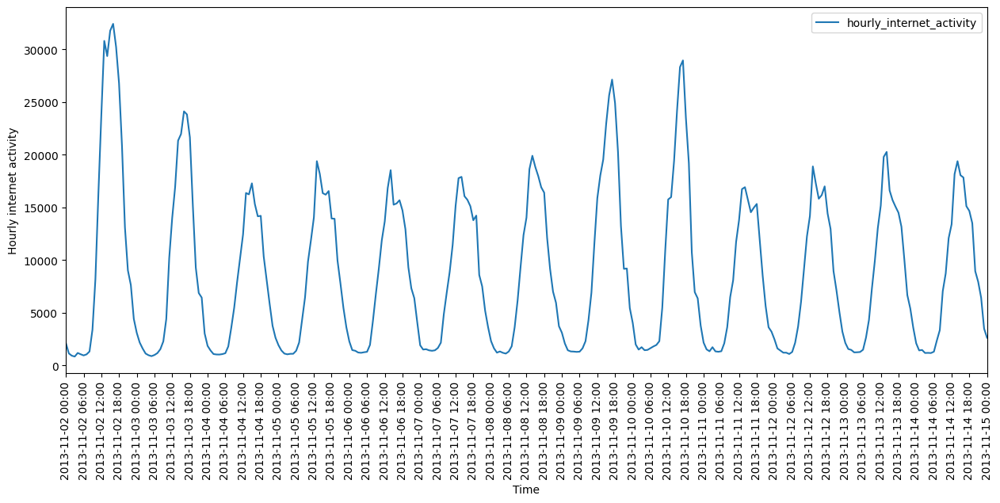

In [ ]:
start_date = pd.to_datetime('2013-11-02 00:00:00')
end_date = pd.to_datetime('2013-11-15 00:00:00')
plt.figure(figsize=(15,6))
sns.lineplot(data=df_5161['2013-11-02 00:00:00':'2013-11-15 00:00:00'])
# Format x-axis tick labels every 6 hours
plt.gca().xaxis.set_major_locator(mdates.HourLocator(interval=6))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
plt.xticks(rotation=90)
plt.xlabel('Time')
plt.ylabel('Hourly internet activity')
plt.xlim(start_date,end_date)
plt.show()

The Traffic pattern shows periodic behavior as expected. The traffic activity increases as the day progresses. It is at its peak during the business hours and starts decresing after that. The traffic goes low during the night hour. Now for 5 consecutive days the traffic shows similar pattern while for two days the traffic activity is higher. Lets investigate the day on 02-11-13.

In [ ]:
# In pandas day_of_week is defined as follows
# Monday: 0
# Tuesday: 1
# Wednesday: 2
# Thursday: 3
# Friday: 4
# Saturday: 5
# Sunday: 6

print(start_date.day_of_week)

5


As we can observe, 02/11/13 and 03/11/13 are weekends. The traffic activity in the weekends is higher than usual behaviour. Considering the nature of the is also consistent with the nature of the square 5161 which has businesses, restaurants and it is a touristic place and it is expected to have tourists visiting this area during weekends which causes higher traffic than weekdays traffic.